In [103]:
import sys
# insert at 1, 0 is the script path (or '' in REPL)
sys.path.insert(1, '\\Users\\lohzy\\Desktop\\CV Lab\\segmentation_models')

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import imageio
import albumentations as albu
import torchvision.transforms as transforms

import torch
import segmentation_models_pytorch as smp

from PIL import Image
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

DATA_DIR = './train_test_val_data'
# DATA_DIR = 'C:\\Users\\lohzy\\Desktop\\CV Lab\\segmentation_models\\examples\\data\\CamVid'

In [2]:
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_segment')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_segment')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_segment')

In [3]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [4]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

In [27]:
class Dataset(BaseDataset):
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
    CLASSES = ['fish']
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            classes=['fish'], 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        
        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)
        
        # extract certain classes from mask (e.g. cars)
        masks = [(mask == 1) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)

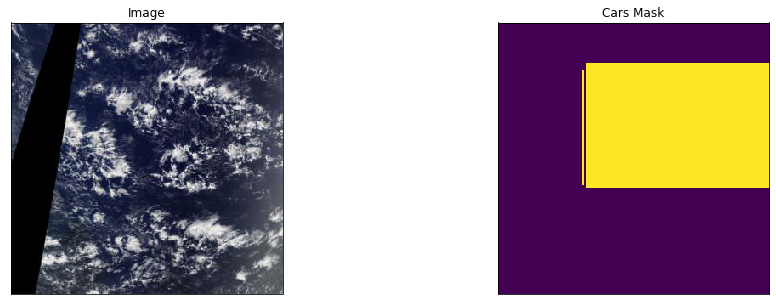

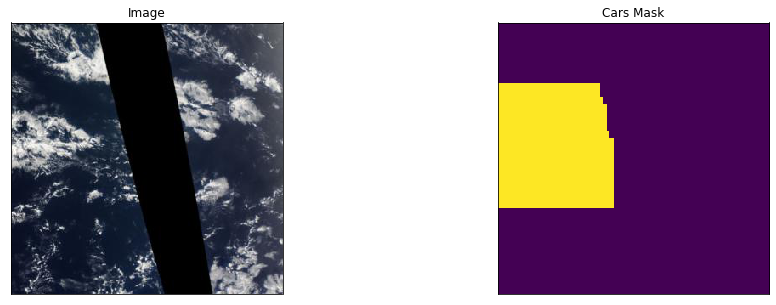

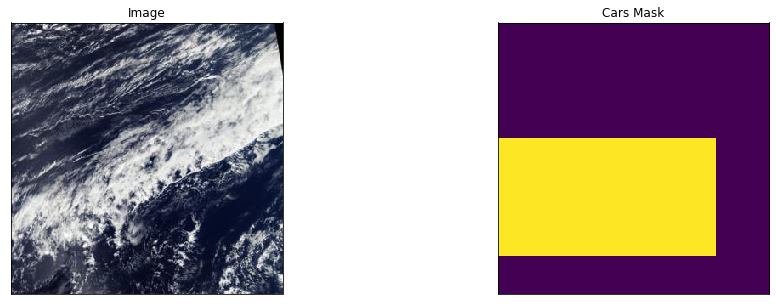

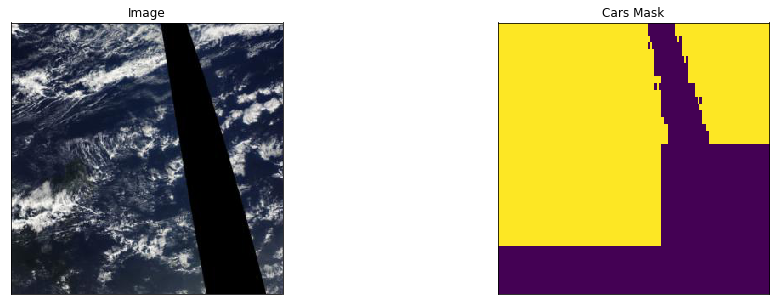

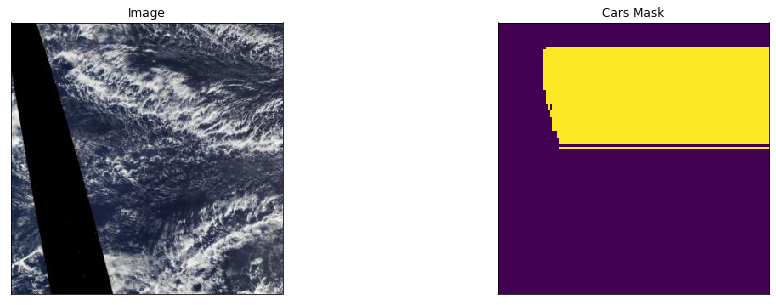

...

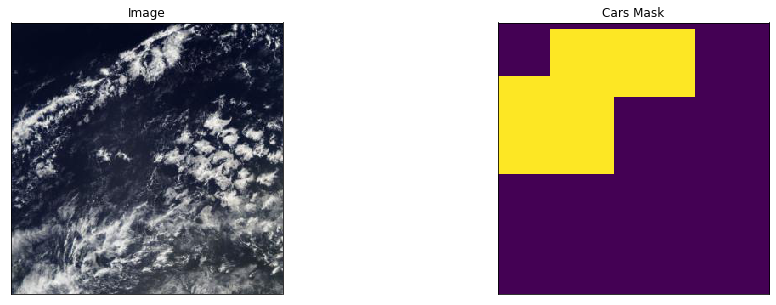

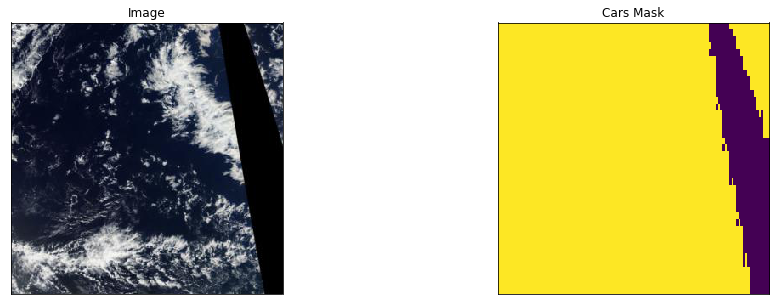

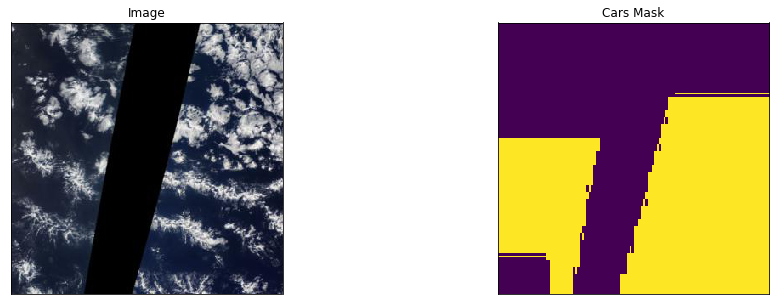

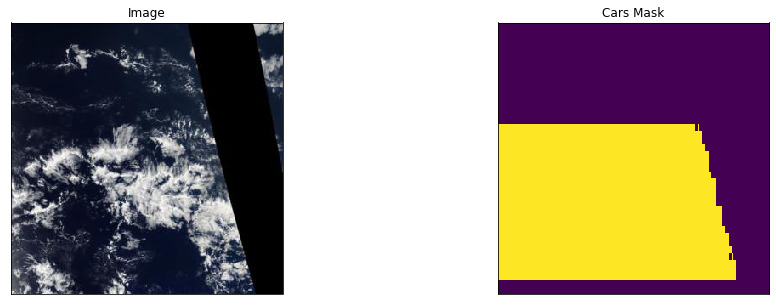

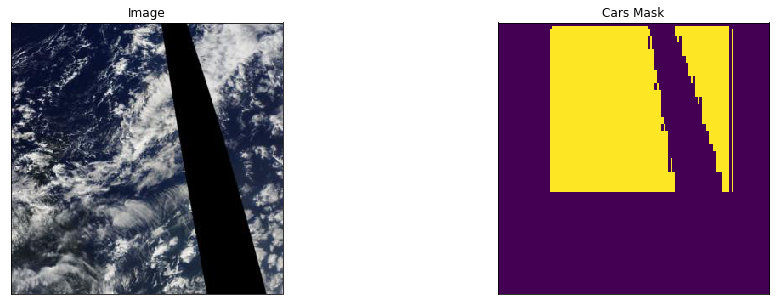

In [28]:
# Lets look at data we have

dataset = Dataset(x_train_dir, y_train_dir)

for idx in np.random.choice(range(len(os.listdir(x_train_dir))),20):
    image, mask = dataset[idx] # get some sample
    visualize(
        image=image, 
        cars_mask=mask.squeeze(),
    )

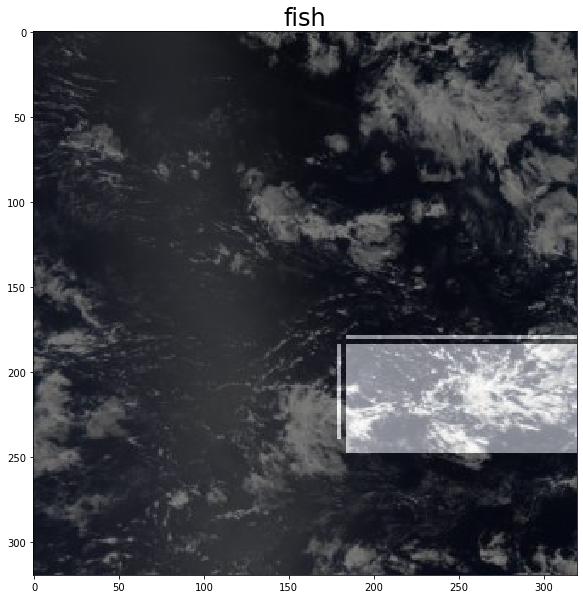

In [36]:
img, mask = dataset[15]
mask = np.repeat(mask,3,2)
plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.imshow(mask, alpha=0.5, cmap='gray')
plt.title('fish', fontsize=24)
plt.show()

In [37]:
np.unique(mask, return_counts=True)

(array([0., 1.]), array([279936,  27264], dtype=int64))

In [38]:
def get_training_augmentation():
    train_transform = [

        albu.HorizontalFlip(p=0.5),

        #albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

        #albu.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        #albu.RandomCrop(height=320, width=320, always_apply=True),

        albu.IAAAdditiveGaussianNoise(p=0.2),
        albu.IAAPerspective(p=0.5),

#         albu.OneOf(
#             [
#                 albu.CLAHE(p=1),
#                 albu.RandomBrightness(p=1),
#                 albu.RandomGamma(p=1),
#             ],
#             p=0.9,
#         ),

#         albu.OneOf(
#             [
#                 albu.IAASharpen(p=1),
#                 albu.Blur(blur_limit=3, p=1),
#                 albu.MotionBlur(blur_limit=3, p=1),
#             ],
#             p=0.9,
#         ),

#         albu.OneOf(
#             [
#                 albu.RandomContrast(p=1),
#                 albu.HueSaturationValue(p=1),
#             ],
#             p=0.9,
#         ),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        albu.PadIfNeeded(384, 480)
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

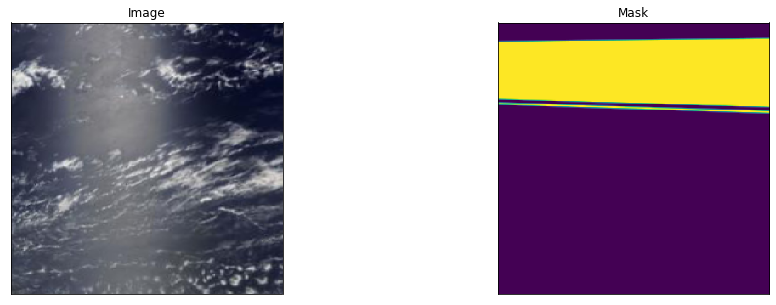

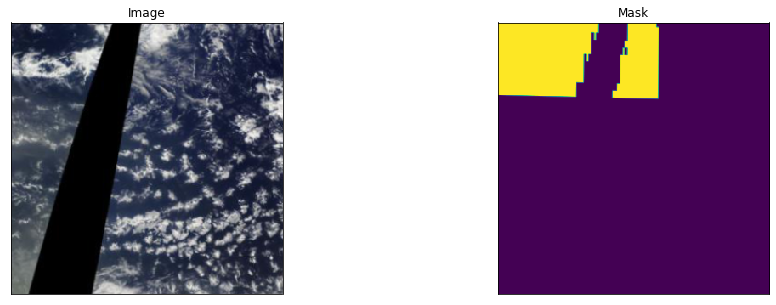

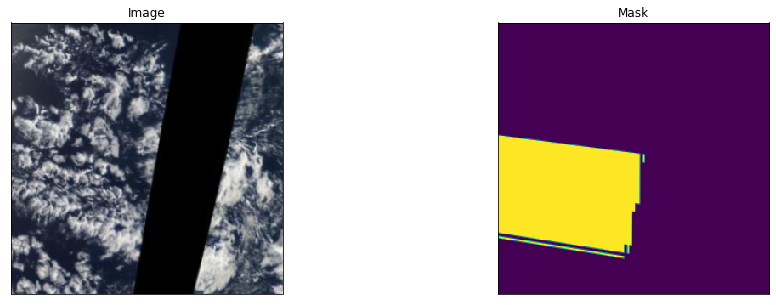

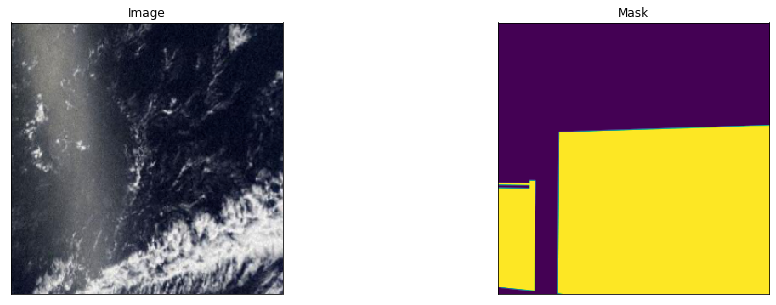

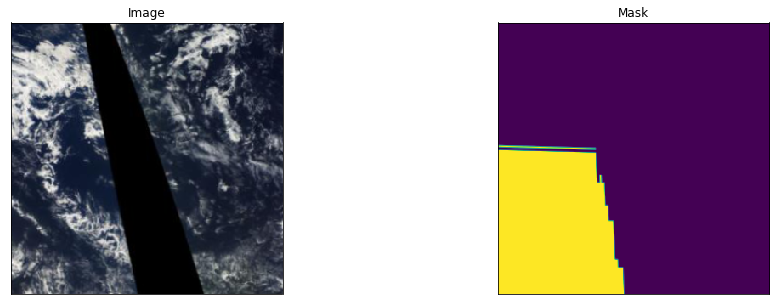

...

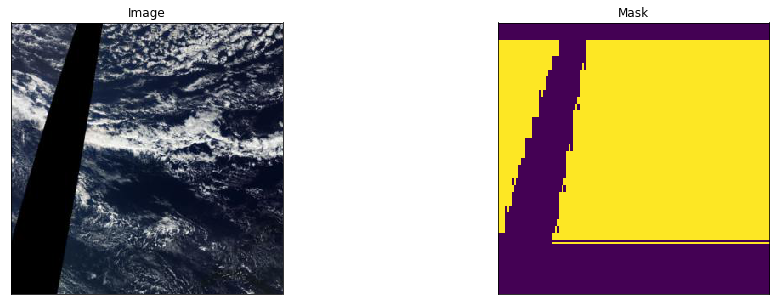

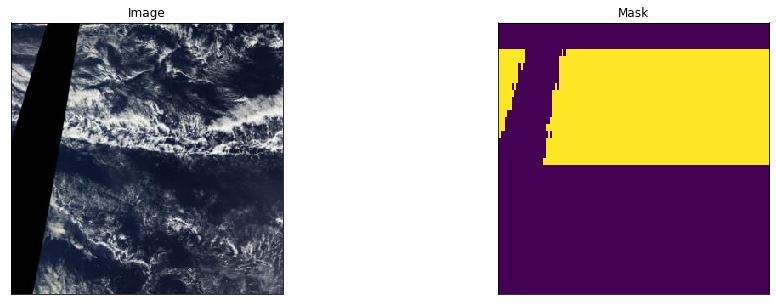

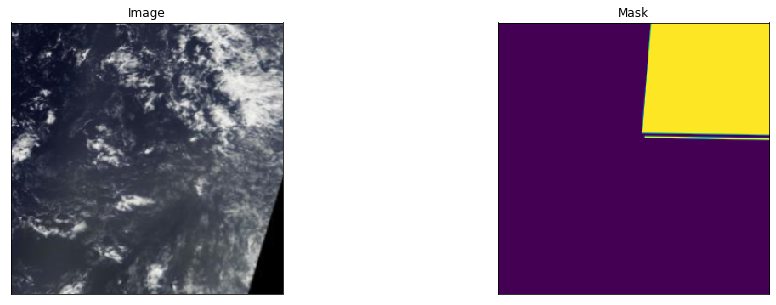

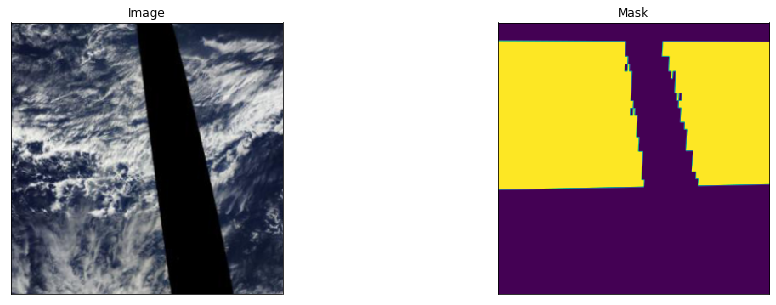

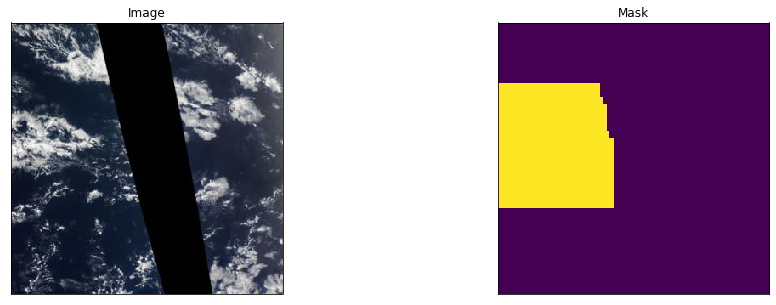

In [42]:
#### Visualize resulted augmented images and masks

augmented_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation=get_training_augmentation(), 
)

# same image with different random transforms
for i in range(1):
    for idx in np.random.choice(range(len(os.listdir(x_train_dir))),20):
        image, mask = augmented_dataset[idx]
        visualize(image=image, mask=mask.squeeze(-1))

In [144]:
ENCODER = 'se_resnext50_32x4d'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=1, 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [145]:
train_dataset = Dataset(
    x_train_dir,
    y_train_dir, 
    augmentation=get_training_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
)

valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

In [146]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [147]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [148]:
# train model for 40 epochs

max_score = 0

for i in range(0, 5):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        print('Model saved!')
        
    if i == 25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|█████████████████████████████████| 236/236 [00:18<00:00, 12.49it/s, dice_loss - 0.4656, iou_score - 0.3929]
Model saved!

Epoch: 1
valid: 100%|█████████████████████████████████| 236/236 [00:19<00:00, 11.87it/s, dice_loss - 0.4499, iou_score - 0.4076]
Model saved!

Epoch: 2
valid: 100%|█████████████████████████████████| 236/236 [00:19<00:00, 12.22it/s, dice_loss - 0.4566, iou_score - 0.4029]

Epoch: 3
valid: 100%|██████████████████████████████████| 236/236 [00:18<00:00, 12.66it/s, dice_loss - 0.443, iou_score - 0.4154]
Model saved!

Epoch: 4
valid: 100%|█████████████████████████████████| 236/236 [00:20<00:00, 11.50it/s, dice_loss - 0.4507, iou_score - 0.4064]


In [149]:
# test dataset without transformations for image visualization
val_dataset_vis = Dataset(
    x_train_dir, y_train_dir
)

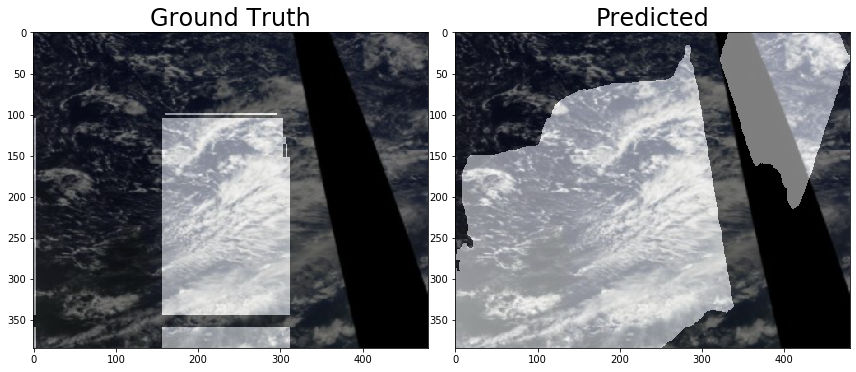

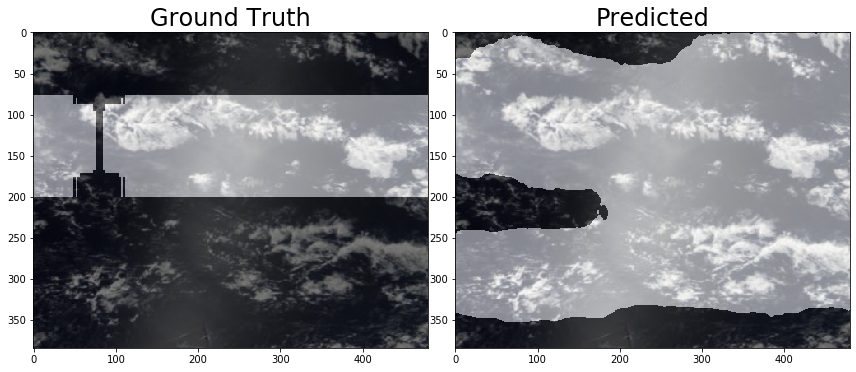

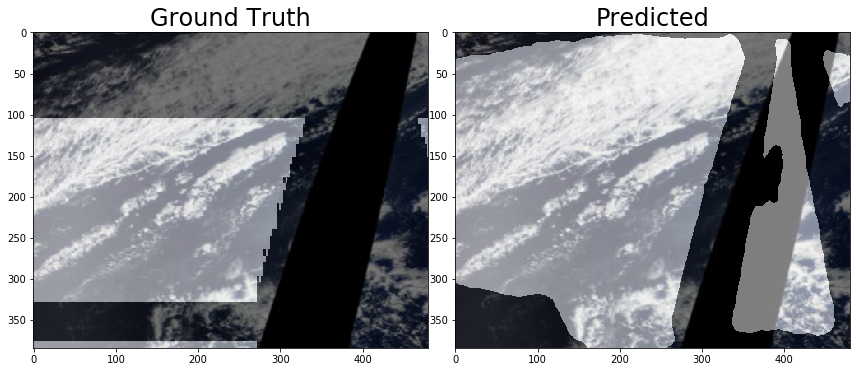

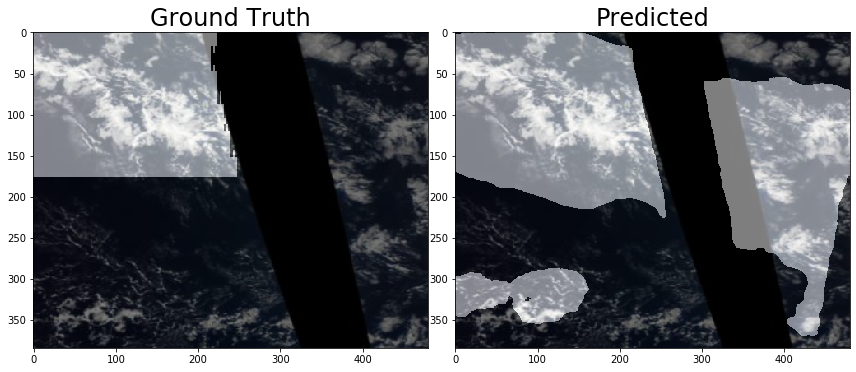

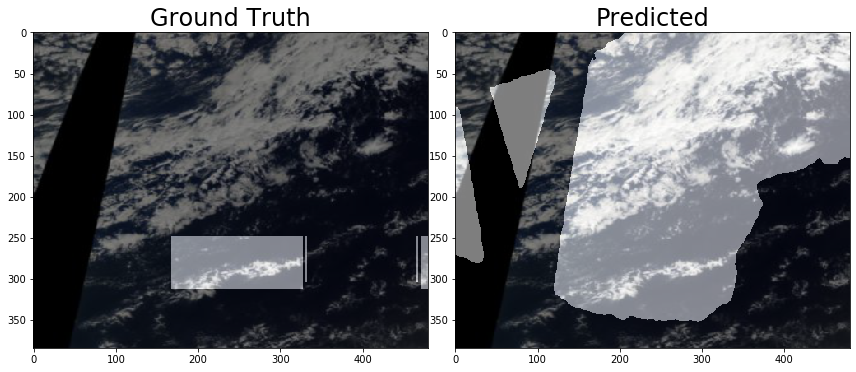

In [161]:
resizer = transforms.Compose([transforms.Resize((384,480))])

for idx in np.random.choice(range(len(os.listdir(x_valid_dir))),5):
    valid_dataset_no_augment = Dataset(x_valid_dir, y_valid_dir)
    img, _ = valid_dataset_no_augment[idx]
    processed_img, gt_mask = valid_dataset[idx]
    
    gt_mask = gt_mask.squeeze()
    img = np.array(resizer(Image.fromarray(img)))

    x_tensor = torch.from_numpy(processed_img).to(DEVICE).unsqueeze(0)
    pr_mask = model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())

    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(img)
    ax[0].imshow(gt_mask, alpha=0.5, cmap='gray')
    ax[0].set_title('Ground Truth', fontsize=24)


    ax[1].imshow(img)
    ax[1].imshow(pr_mask, alpha=0.5, cmap='gray')
    ax[1].set_title('Predicted', fontsize=24)

    plt.tight_layout(h_pad=0.1, w_pad=0.1)
    plt.show()

In [95]:
# test dataset without transformations for image visualization
test_dataset_vis = Dataset(
    x_valid_dir, y_valid_dir
)

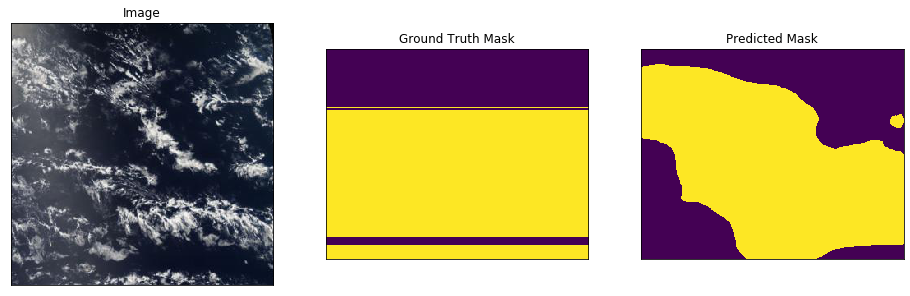

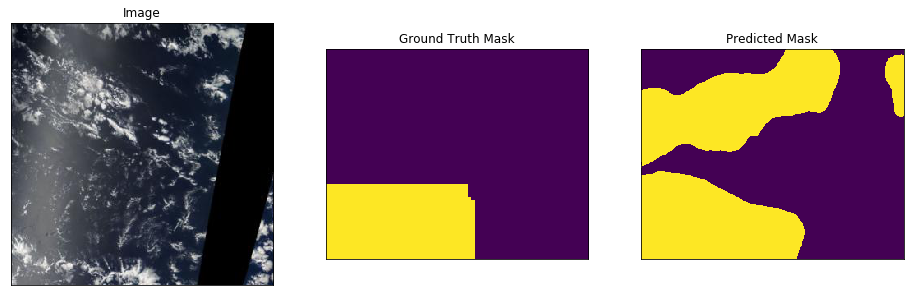

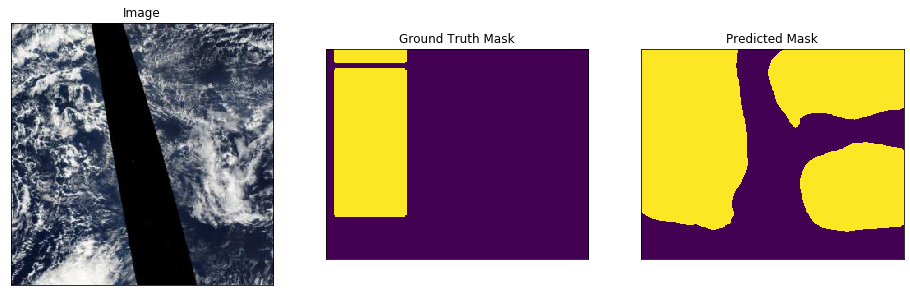

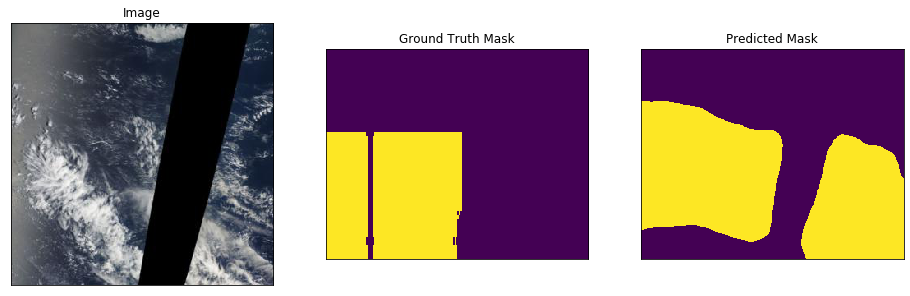

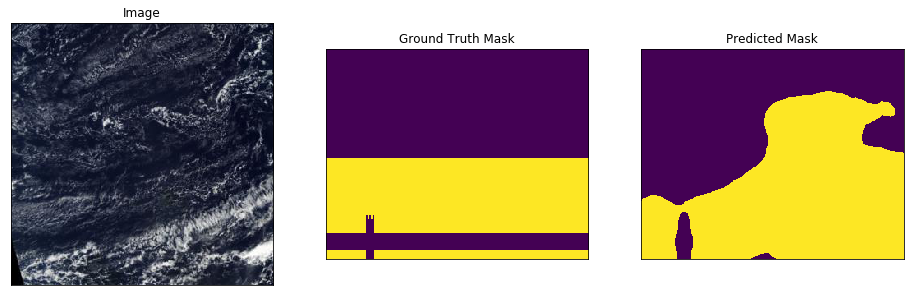

In [96]:
for i in range(5):
    n = np.random.choice(len(valid_dataset))
    
    image_vis = test_dataset_vis[n][0].astype('uint8')
    image, gt_mask = valid_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
        
    visualize(
        image=image_vis, 
        ground_truth_mask=gt_mask, 
        predicted_mask=pr_mask
    )